In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from sklearn.model_selection import train_test_split
import json
import glob
import random
import collections
from glob import glob
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
import keras
from PIL import Image

In [2]:
from glob import glob
trn1='D:/data/data/invasive-aquatic-species-data/invasive/*/'
trn2='D:/data/data/invasive-aquatic-species-data/noninvasive/*/'
tr1= glob(trn1)
tr2= glob(trn2)

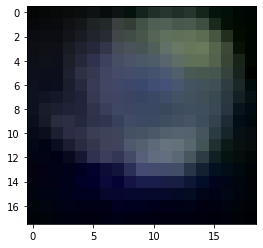

In [3]:
imgs = glob(tr1[6]+'/*')
c = Image.open(imgs[5])
plt.imshow(c)

In [4]:
inv_c = 0
for i in tr1:
    for j in glob(i+'/*'):
        inv_c = inv_c + 1

ninv_c = 0
for i in tr2:
    for j in glob(i+'/*'):
        ninv_c = ninv_c + 1

In [13]:
ninv_c

93687

In [5]:
tran_index_inv = np.round( len(tr1)* .8  )
tran_index_noninv = np.round( len(tr2)* .8  )
tran_index_noninv

2960.0

In [65]:
data = []
for i in tr1[:(int) (tran_index_inv)]:
    for j in glob(i+'/*'):
        data.append(j)

ydata = []
        
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (40, 40))
    c = np.array(b)
    ydata.append(c.reshape(40*40*3))
    
        
xdata = np.array(ydata)
x_train = xdata
x_train = x_train.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train),40*40*3))


for i in tr2[:(int)(tran_index_noninv)]:
    for j in glob(i+'/*'):
        data.append(j)


        imgdata=[]
        
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (40,40))
    c = np.array(b)
    imgdata.append(c.reshape(40*40*3))

    
xdata = np.array(imgdata)
x_train_noninv = xdata
x_train_noninv = x_train_noninv.astype('float32') / 255.
x_train_noninv = np.reshape( x_train_noninv , (len( x_train_noninv ),40*40*3))



In [13]:
data = []
label = []
for i in tr1[:(int) (tran_index_inv)]:
    for j in glob(i+'/*'):
        data.append(j)
        label.append(1)

ydata = []
        
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (40, 40))
    c = np.array(b)
    ydata.append(c.reshape(40*40*3))
    
        
xdata = np.array(ydata)
x_train = xdata
x_train = x_train.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train),40*40*3))

for i in tr2[:(int)(tran_index_noninv)]:
    for j in glob(i+'/*'):
        data.append(j)
        label.append(0)

imgdata=[]
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (4040))
    c = np.array(b)
    imgdata.append(c.reshape(40*40*3))
    

In [67]:
np.shape(x_train)

(15621, 4800)

In [17]:
from tensorflow.keras.utils import to_categorical
idata = np.array(imgdata)
X_train = idata
X_train = X_train.astype('float32') / 255.
X_train = np.reshape(X_train, (len(X_train),40*40*3))
# One hot vector representation of labels
Y_train = to_categorical(label)

In [19]:
data = []
label = []
for i in tr1[(int) (tran_index_inv) + 1 :]:
    for j in glob(i+'/*'):
        data.append(j)
        label.append(1)


for i in tr2[ (int)(tran_index_noninv) + 1:]:
    for j in glob(i+'/*'):
        data.append(j)
        label.append(0)

imgdata=[]
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (40 , 40))
    c = np.array(b)
    imgdata.append(c.reshape(40*40*3))
    

In [22]:
np.shape(imgdata)

(20196, 25, 25, 3)

In [20]:
from tensorflow.keras.utils import to_categorical
idata = np.array(imgdata)
X_test = idata
X_test = X_test.astype('float32') / 255.
X_test = np.reshape(X_test, (len(X_test),40*40*3))
# One hot vector representation of labels
Y_test = to_categorical(label)

In [28]:
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasClassifier
import keras.backend as K

def get_f1(y_true, y_pred): #taken from old keras source code
    tp = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    
    tn = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    fp = K.sum(K.round(K.clip((1-y_true) * (y_pred), 0, 1)))
    fn = K.sum(K.round(K.clip((y_true) * (1-y_pred), 0, 1)))
    

    f1_val = tp / ( tp + ( (1/2) * (fp+fn) ) + K.epsilon())
    return f1_val

In [22]:
import numpy as np
import pandas as pd

from skimage.io import imread
from skimage.transform import resize
from keras import layers
from keras import models
import keras
from keras.layers import LeakyReLU
from keras.models import Sequential, Model, load_model
from keras.layers import Input, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Dense, Dropout, Activation, Flatten
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


In [ ]:


def create_encoder():
    
    input_img = Input(shape=(img_rows*img_cols*channels,))
    
    autoencoder.add(Dense(1024, input_img))

    autoencoder.add(Dense(512,activation="relu"))
    
    autoencoder.add(Dense(100),name='encoder')

    autoencoder.add(Dense(512,activation="relu"))

    autoencoder.add(Dense(img_rows*img_cols*channels, activation='relu'))
    
    generator.compile(loss='mse', optimizer=optimizer)
    return encoder

In [55]:
from tensorflow.keras.optimizers import Adam
import numpy as np

np.random.seed(10)

noise_dim = 100

batch_size = 32
steps_per_epoch = 3750
epochs = 40

save_path = 'fcgan-images'

img_rows, img_cols, channels = 40, 40, 3

optimizer = Adam(0.0002, 0.5)

from keras.models import Sequential
from keras.layers import Dense
from keras.layers.advanced_activations import LeakyReLU

def create_generator():
    generator = Sequential()
    
    generator.add(Dense(256, input_dim=noise_dim))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(512))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(1024))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(img_rows*img_cols*channels, activation='tanh'))
    
    generator.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])
    return generator

In [80]:


def create_classifier():
    classifier = Sequential()
    
    classifier.add(Dense(1024, input_dim=img_rows*img_cols*channels))

    classifier.add(Dense(256,activation="relu"))

    classifier.add(Dense(2, activation='softmax'))
    
    classifier.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=[get_f1])
    
    return classifier

In [57]:
def create_discriminator():
    discriminator = Sequential()
     
    discriminator.add(Dense(1024, input_dim=img_rows*img_cols*channels))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(512))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Dense(1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return discriminator

In [100]:
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam')
    return gan
d =create_discriminator()
g=create_generator()
gan = create_gan(d,g)
gan.summary()

Model: "model_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
sequential_77 (Sequential)   (None, 4800)              5602752   
_________________________________________________________________
sequential_76 (Sequential)   (None, 1)                 5572609   
Total params: 11,175,361
Trainable params: 5,602,752
Non-trainable params: 5,572,609
_________________________________________________________________


In [101]:
def create_gan(discriminator, generator, classifier):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])
    return gan

d = create_discriminator()
g = create_generator()
c = create_classifier()
gan = create_gan(d,g,c)
gan.summary()

Model: "model_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
sequential_79 (Sequential)   (None, 4800)              5602752   
_________________________________________________________________
sequential_78 (Sequential)   (None, 1)                 5572609   
Total params: 11,175,361
Trainable params: 5,602,752
Non-trainable params: 5,572,609
_________________________________________________________________


In [99]:
def get_label(n,m,o):
    
    label = []
    
    for i in range(0,n):
        label.append(1)
        
    for i in range(0,m):
        label.append(1)
        
    for i in range(0,o):
        label.append(0)
    
    Y_train = to_categorical(label)
    
    return Y_train

In [72]:
yt =get_label(32,32,64)
np.shape(yt)

(128, 2)

In [77]:
print(Y_train[90000],yt[1])

[1. 0.] [1. 0.]


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 1


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 15.58it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


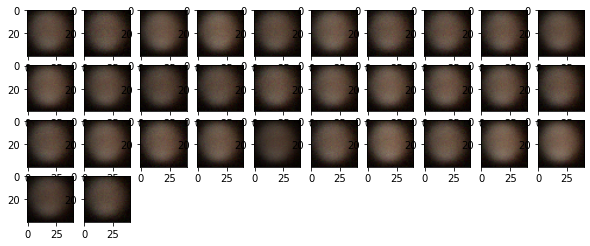

  2%|█▎                                                                                | 2/128 [00:00<00:09, 13.99it/s]

Epoch 2


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 15.63it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


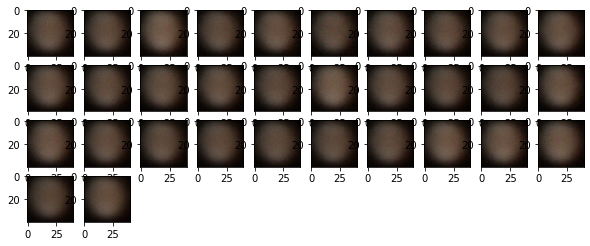

  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.08it/s]

Epoch 3


  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.49it/s]

Epoch 4


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 14.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


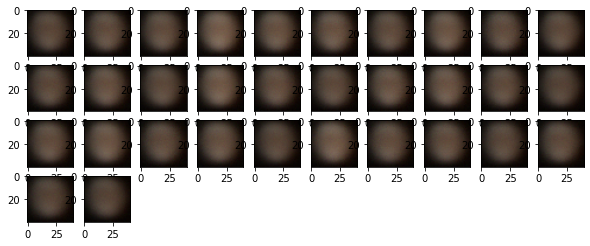

  2%|█▎                                                                                | 2/128 [00:00<00:09, 13.42it/s]

Epoch 5


  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.93it/s]

Epoch 6


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 15.27it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


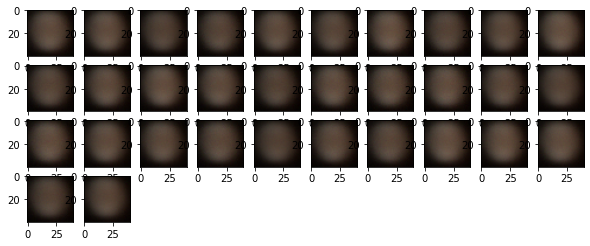

  2%|█▎                                                                                | 2/128 [00:00<00:07, 16.95it/s]

Epoch 7


  2%|█▎                                                                                | 2/128 [00:00<00:07, 17.24it/s]

Epoch 8


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:07<00:00, 16.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


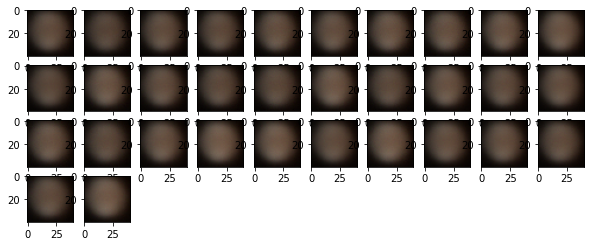

  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.71it/s]

Epoch 9


  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.60it/s]

Epoch 10


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 15.29it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


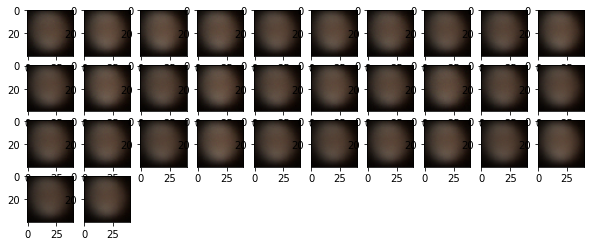

  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.60it/s]

Epoch 11


  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.71it/s]

Epoch 12


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 15.12it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


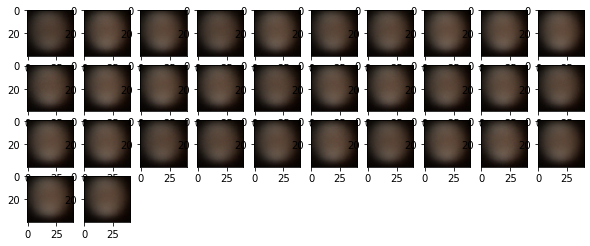

  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.81it/s]

Epoch 13


  2%|█▎                                                                                | 2/128 [00:00<00:07, 17.39it/s]

Epoch 14


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:07<00:00, 16.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


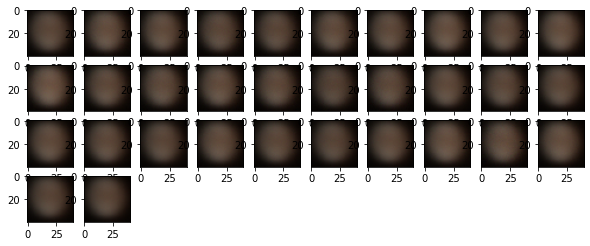

  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.49it/s]

Epoch 15


  2%|█▎                                                                                | 2/128 [00:00<00:08, 14.71it/s]

Epoch 16


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 14.29it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


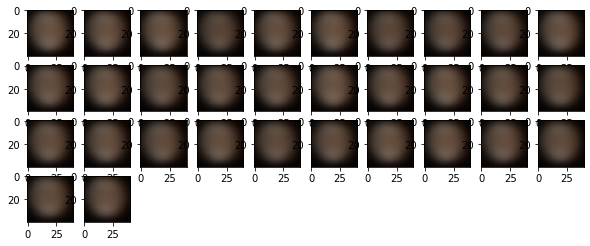

  2%|█▎                                                                                | 2/128 [00:00<00:08, 15.27it/s]

Epoch 17


  2%|█▎                                                                                | 2/128 [00:00<00:08, 15.27it/s]

Epoch 18


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:08<00:00, 14.60it/s]


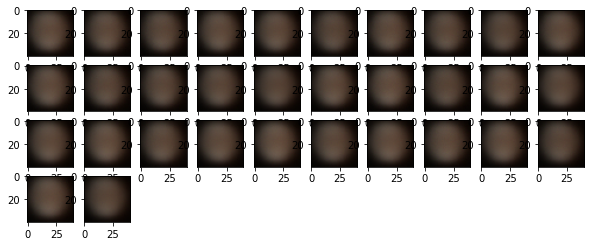

  2%|█▎                                                                                | 2/128 [00:00<00:08, 15.27it/s]

Epoch 19


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 1


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:39<00:00,  3.21it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {31.25}  Classifier F1: {83.59375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

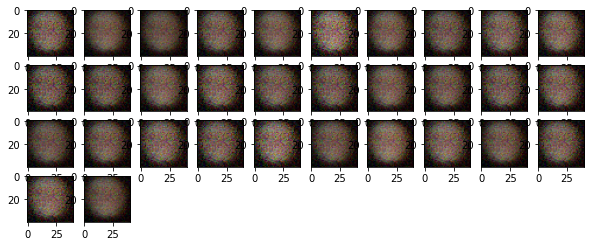

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 2


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {81.25}
Epoch 3


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {84.375}
Epoch 4


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {0.0}  Classifier F1: {87.5}
Epoch 5


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {82.03125}
Epoch 6


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}
Epoch 7


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 8


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {84.375}
Epoch 9


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 10


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:43<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {87.5}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

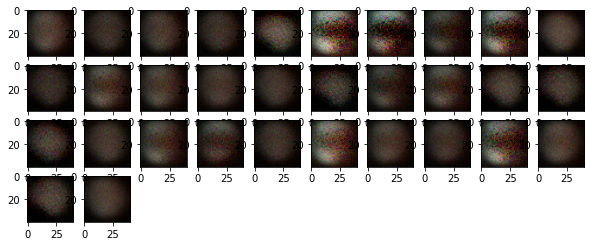

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 11


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {89.0625}
Epoch 12


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {20.3125}  Classifier F1: {87.5}
Epoch 13


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {85.15625}
Epoch 14


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {85.9375}
Epoch 15


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.53125}  Classifier F1: {79.6875}
Epoch 16


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {91.40625}
Epoch 17


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {89.0625}
Epoch 18


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 19


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {34.765625}  Classifier F1: {84.375}
Epoch 20


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:42<00:00,  3.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

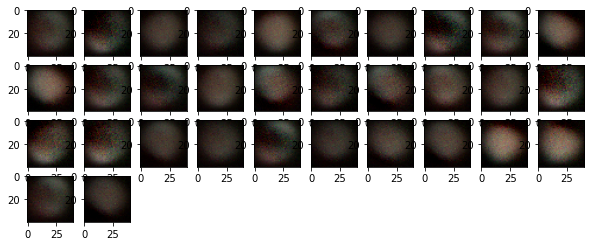

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 21


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.0625}  Classifier F1: {92.96875}
Epoch 22


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.5}  Classifier F1: {85.9375}
Epoch 23


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {81.25}
Epoch 24


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.40625}  Classifier F1: {89.0625}
Epoch 25


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {90.625}
Epoch 26


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {88.28125}
Epoch 27


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {92.1875}
Epoch 28


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.453125}  Classifier F1: {83.59375}
Epoch 29


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {89.0625}
Epoch 30


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:38<00:00,  3.31it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {25.390625}  Classifier F1: {85.15625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

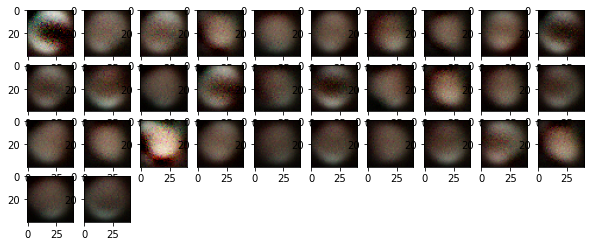

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 31


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {90.625}
Epoch 32


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {26.953125}  Classifier F1: {86.71875}
Epoch 33


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {84.375}
Epoch 34


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {91.40625}
Epoch 35


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {35.9375}  Classifier F1: {88.28125}
Epoch 36


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {87.5}
Epoch 37


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {24.609375}  Classifier F1: {85.9375}
Epoch 38


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {85.15625}
Epoch 39


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {40.234375}  Classifier F1: {92.1875}
Epoch 40


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:38<00:00,  3.32it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {40.234375}  Classifier F1: {80.46875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

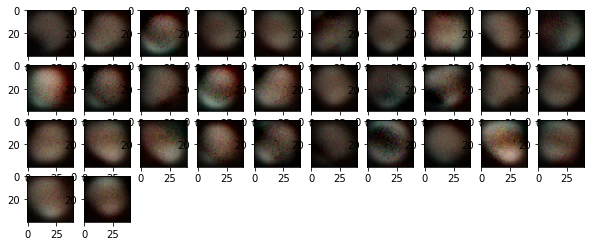

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 41


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {92.96875}
Epoch 42


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.578125}  Classifier F1: {85.9375}
Epoch 43


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.0625}
Epoch 44


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.1875}  Classifier F1: {88.28125}
Epoch 45


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.96875}  Classifier F1: {84.375}
Epoch 46


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {85.15625}
Epoch 47


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {90.625}
Epoch 48


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {87.5}
Epoch 49


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {85.9375}
Epoch 50


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:46<00:00,  2.76it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

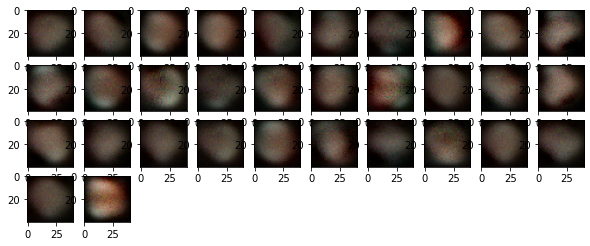

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 51


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.796875}  Classifier F1: {86.71875}
Epoch 52


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.53125}  Classifier F1: {88.28125}
Epoch 53


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {85.15625}
Epoch 54


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {82.8125}
Epoch 55


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {87.5}
Epoch 56


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {85.9375}
Epoch 57


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.15625}
Epoch 58


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 59


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {90.625}
Epoch 60


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:41<00:00,  3.07it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.53125}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

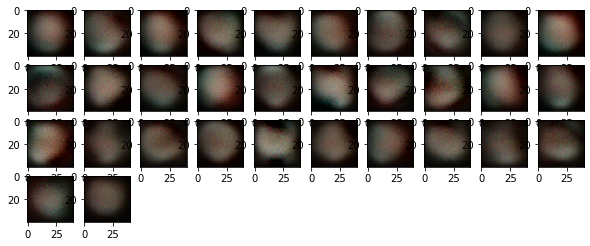

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 61


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.96875}  Classifier F1: {81.25}
Epoch 62


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {32.421875}  Classifier F1: {89.84375}
Epoch 63


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {88.28125}
Epoch 64


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.15625}
Epoch 65


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 66


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {28.90625}  Classifier F1: {81.25}
Epoch 67


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {85.15625}
Epoch 68


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {89.0625}
Epoch 69


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {83.59375}
Epoch 70


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:41<00:00,  3.11it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.921875}  Classifier F1: {83.59375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

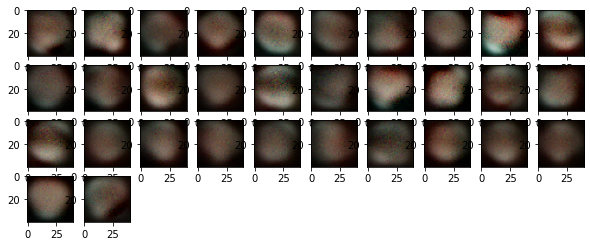

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 71


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.5}  Classifier F1: {85.15625}
Epoch 72


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {83.59375}
Epoch 73


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {83.59375}
Epoch 74


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {87.5}
Epoch 75


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.890625}  Classifier F1: {90.625}
Epoch 76


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {89.0625}
Epoch 77


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {83.59375}
Epoch 78


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.109375}  Classifier F1: {84.375}
Epoch 79


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {84.375}
Epoch 80


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:46<00:00,  2.77it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {46.484375}  Classifier F1: {85.9375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

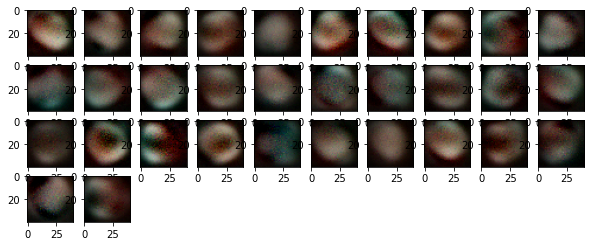

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 81


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {89.0625}
Epoch 82


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {87.5}
Epoch 83


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 84


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {82.03125}
Epoch 85


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {7.421875}  Classifier F1: {86.71875}
Epoch 86


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {88.28125}
Epoch 87


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {88.28125}
Epoch 88


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {86.71875}
Epoch 89


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {84.375}
Epoch 90


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:44<00:00,  2.85it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.921875}  Classifier F1: {87.5}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

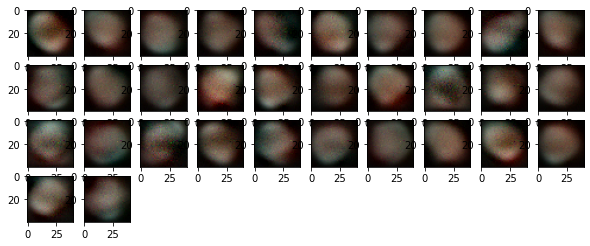

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 91


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {84.375}
Epoch 92


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {89.84375}
Epoch 93


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {88.28125}
Epoch 94


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {84.375}
Epoch 95


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {89.84375}
Epoch 96


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {82.8125}
Epoch 97


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {79.6875}
Epoch 98


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {85.15625}
Epoch 99


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {81.25}
Epoch 100


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:39<00:00,  3.24it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {41.015625}  Classifier F1: {84.375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

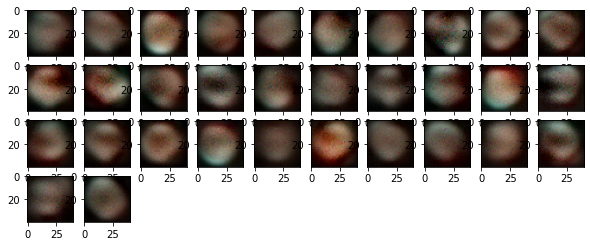

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 101


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.84375}
Epoch 102


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {92.1875}
Epoch 103


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 104


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {94.53125}
Epoch 105


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {84.375}
Epoch 106


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.015625}  Classifier F1: {85.9375}
Epoch 107


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {91.40625}
Epoch 108


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {85.9375}
Epoch 109


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}
Epoch 110


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:41<00:00,  3.12it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {83.59375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

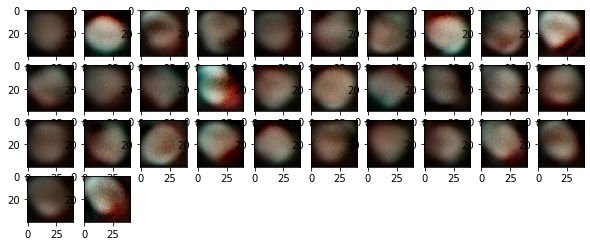

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 111


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 112


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {32.8125}  Classifier F1: {89.0625}
Epoch 113


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {85.9375}
Epoch 114


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {86.71875}
Epoch 115


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {89.0625}
Epoch 116


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.75}  Classifier F1: {83.59375}
Epoch 117


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {28.515625}  Classifier F1: {87.5}
Epoch 118


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.015625}  Classifier F1: {84.375}
Epoch 119


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {82.03125}
Epoch 120


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.80it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

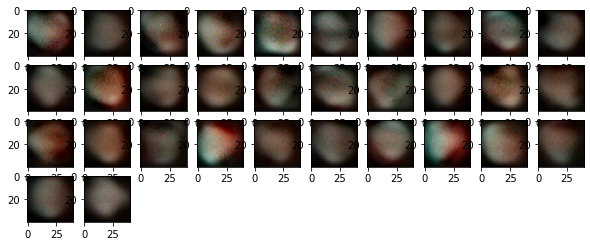

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 121


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {86.71875}
Epoch 122


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {85.15625}
Epoch 123


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {40.625}  Classifier F1: {86.71875}
Epoch 124


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {83.59375}
Epoch 125


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {86.71875}
Epoch 126


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {88.28125}
Epoch 127


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 128


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {80.46875}
Epoch 129


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {82.03125}
Epoch 130


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {85.15625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

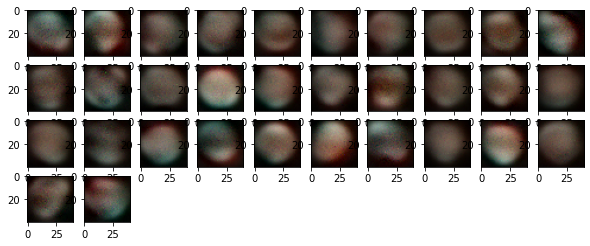

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 131


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {85.9375}
Epoch 132


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.015625}  Classifier F1: {83.59375}
Epoch 133


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 134


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {88.28125}
Epoch 135


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.9375}
Epoch 136


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {36.328125}  Classifier F1: {85.15625}
Epoch 137


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.9375}
Epoch 138


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {89.0625}
Epoch 139


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 140


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {47.65625}  Classifier F1: {82.03125}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

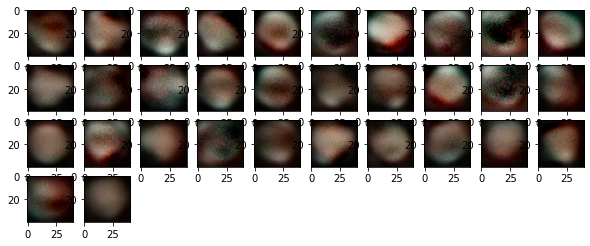

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 141


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {91.40625}
Epoch 142


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 143


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {92.96875}
Epoch 144


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {89.0625}
Epoch 145


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.15625}
Epoch 146


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {85.9375}
Epoch 147


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {90.625}
Epoch 148


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {90.625}
Epoch 149


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.40625}  Classifier F1: {90.625}
Epoch 150


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {46.484375}  Classifier F1: {81.25}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

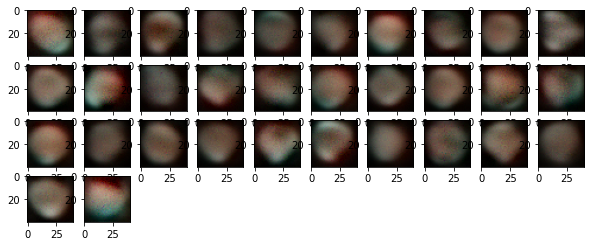

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 151


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {84.375}
Epoch 152


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {87.5}
Epoch 153


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {88.28125}
Epoch 154


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {88.28125}
Epoch 155


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {35.546875}  Classifier F1: {87.5}
Epoch 156


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {85.9375}
Epoch 157


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.0625}
Epoch 158


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {81.25}
Epoch 159


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {87.5}
Epoch 160


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.83it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

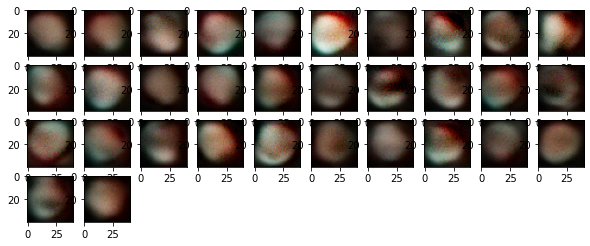

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 161


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.84375}  Classifier F1: {80.46875}
Epoch 162


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.453125}  Classifier F1: {89.84375}
Epoch 163


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {85.9375}
Epoch 164


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {87.5}
Epoch 165


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {84.375}
Epoch 166


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {83.59375}
Epoch 167


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 168


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {85.9375}
Epoch 169


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}
Epoch 170


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.12it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.828125}  Classifier F1: {94.53125}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

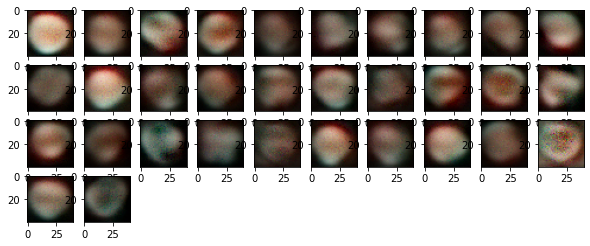

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 171


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {87.5}
Epoch 172


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 173


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.453125}  Classifier F1: {89.0625}
Epoch 174


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {87.5}
Epoch 175


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.9375}
Epoch 176


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 177


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {90.625}
Epoch 178


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {85.15625}
Epoch 179


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {83.59375}
Epoch 180


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:36<00:00,  3.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {85.15625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

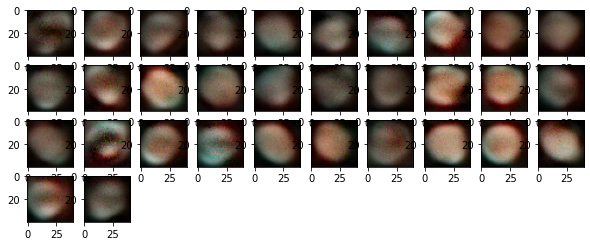

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 181


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {88.28125}
Epoch 182


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}
Epoch 183


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.84375}
Epoch 184


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}
Epoch 185


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}
Epoch 186


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {85.15625}
Epoch 187


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {85.9375}
Epoch 188


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.84375}
Epoch 189


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {88.28125}
Epoch 190


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.921875}  Classifier F1: {84.375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

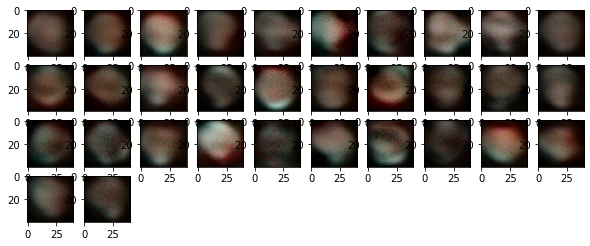

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 191


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 192


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {90.625}
Epoch 193


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {89.0625}
Epoch 194


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}
Epoch 195


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {87.5}
Epoch 196


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {80.46875}
Epoch 197


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {85.15625}
Epoch 198


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.0625}
Epoch 199


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {92.1875}
Epoch 200


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.84it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.53125}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

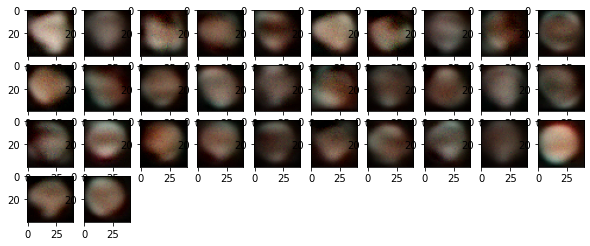

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 201


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {91.40625}
Epoch 202


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.9375}
Epoch 203


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.9375}
Epoch 204


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 205


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {85.15625}
Epoch 206


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.0625}  Classifier F1: {90.625}
Epoch 207


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {84.375}
Epoch 208


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {84.375}
Epoch 209


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.15625}
Epoch 210


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:36<00:00,  3.49it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.046875}  Classifier F1: {87.5}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

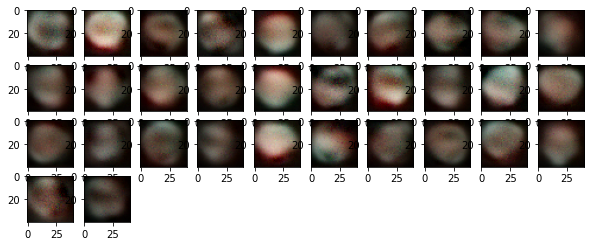

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 211


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.578125}  Classifier F1: {86.71875}
Epoch 212


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {83.59375}
Epoch 213


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.890625}  Classifier F1: {89.84375}
Epoch 214


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.96875}  Classifier F1: {82.03125}
Epoch 215


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}
Epoch 216


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}
Epoch 217


  1%|▋                                                                                 | 1/128 [00:00<00:27,  4.60it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.84375}
Epoch 218


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {88.28125}
Epoch 219


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 220


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.85it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {47.65625}  Classifier F1: {84.375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

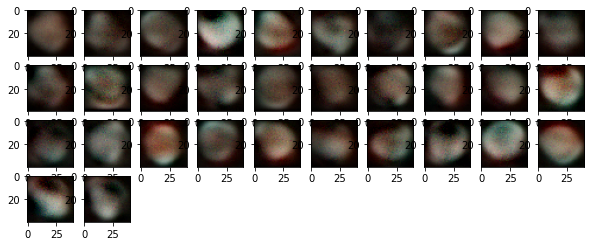

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 221


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {85.9375}
Epoch 222


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {88.28125}
Epoch 223


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {89.0625}
Epoch 224


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.75}  Classifier F1: {87.5}
Epoch 225


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {85.9375}
Epoch 226


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {83.59375}
Epoch 227


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {85.15625}
Epoch 228


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.96875}  Classifier F1: {86.71875}
Epoch 229


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {84.375}
Epoch 230


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:30<00:00,  4.17it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.140625}  Classifier F1: {89.84375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

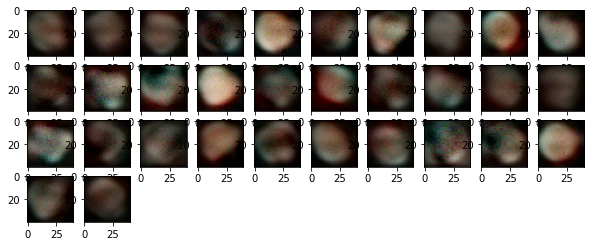

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 231


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {91.40625}
Epoch 232


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {93.75}
Epoch 233


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {86.71875}
Epoch 234


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {82.8125}
Epoch 235


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {91.40625}
Epoch 236


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {84.375}
Epoch 237


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {86.71875}
Epoch 238


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {84.375}
Epoch 239


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}
Epoch 240


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.86it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

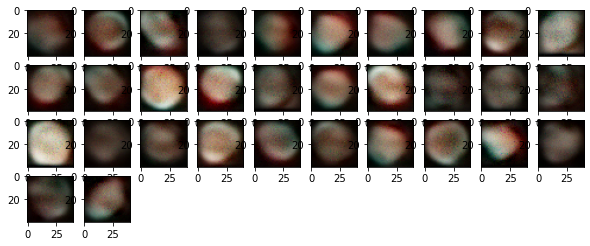

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 241


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 242


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {91.40625}
Epoch 243


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {88.28125}
Epoch 244


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 245


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {80.46875}
Epoch 246


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 247


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.9375}
Epoch 248


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {85.9375}
Epoch 249


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 250


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.07it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.21875}  Classifier F1: {85.15625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

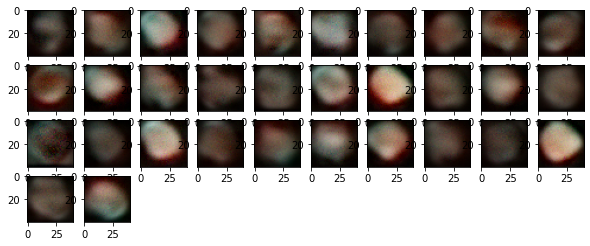

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 251


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {87.5}
Epoch 252


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {89.84375}
Epoch 253


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {82.03125}
Epoch 254


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {81.25}
Epoch 255


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {91.40625}
Epoch 256


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {91.40625}
Epoch 257


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 258


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 259


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {88.28125}
Epoch 260


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.84it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.4375}  Classifier F1: {85.9375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

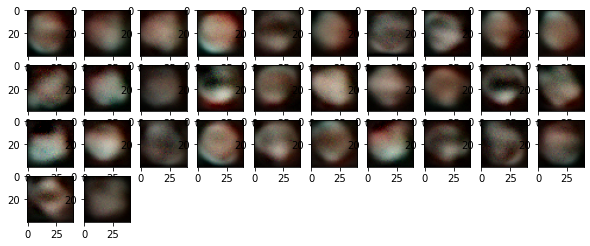

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 261


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {83.59375}
Epoch 262


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {91.40625}
Epoch 263


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {85.15625}
Epoch 264


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {80.46875}
Epoch 265


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {91.40625}
Epoch 266


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {85.9375}
Epoch 267


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {87.5}
Epoch 268


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {84.375}
Epoch 269


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.1875}  Classifier F1: {91.40625}
Epoch 270


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {1.953125}  Classifier F1: {83.59375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

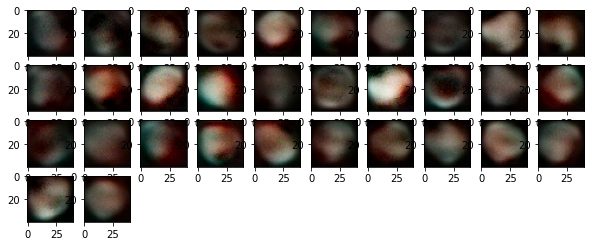

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 271


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {82.8125}
Epoch 272


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {85.15625}
Epoch 273


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 274


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {85.9375}
Epoch 275


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.1875}  Classifier F1: {90.625}
Epoch 276


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.9375}
Epoch 277


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {84.375}
Epoch 278


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {91.40625}
Epoch 279


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {86.71875}
Epoch 280


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.046875}  Classifier F1: {90.625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

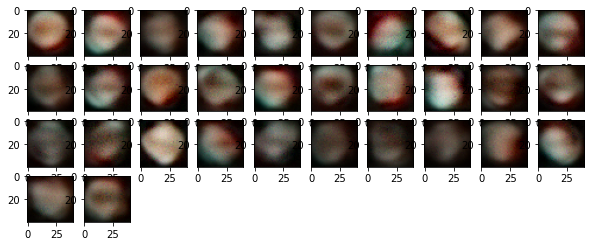

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 281


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {90.625}
Epoch 282


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {85.15625}
Epoch 283


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 284


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.15625}
Epoch 285


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.0625}
Epoch 286


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {85.9375}
Epoch 287


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 288


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {90.625}
Epoch 289


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {84.375}
Epoch 290


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

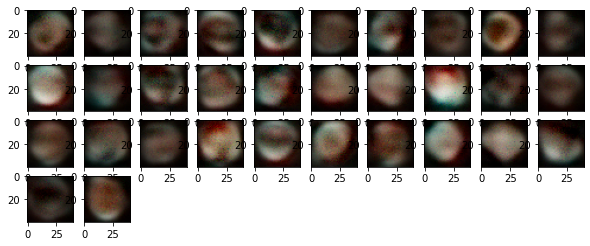

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 291


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {86.71875}
Epoch 292


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {84.375}
Epoch 293


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 294


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {90.625}
Epoch 295


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {85.9375}
Epoch 296


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.84375}
Epoch 297


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {87.5}
Epoch 298


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {85.9375}
Epoch 299


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.09375}  Classifier F1: {85.15625}
Epoch 300


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {22.265625}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

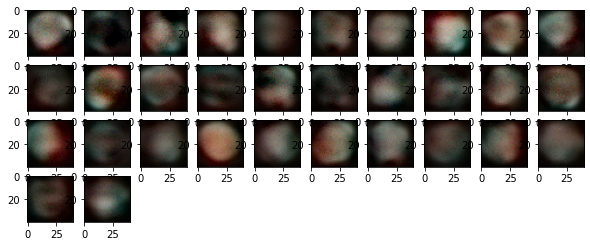

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 301


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {88.28125}
Epoch 302


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {87.5}
Epoch 303


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {88.28125}
Epoch 304


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {85.15625}
Epoch 305


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {90.625}
Epoch 306


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {90.625}
Epoch 307


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {86.71875}
Epoch 308


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {82.8125}
Epoch 309


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {82.03125}
Epoch 310


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.53125}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

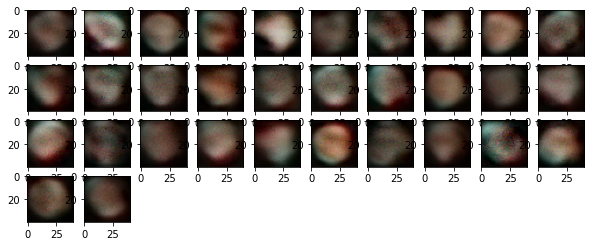

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 311


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {86.71875}
Epoch 312


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {43.359375}  Classifier F1: {88.28125}
Epoch 313


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {88.28125}
Epoch 314


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {85.15625}
Epoch 315


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {89.84375}
Epoch 316


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {85.15625}
Epoch 317


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {89.84375}
Epoch 318


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {88.28125}
Epoch 319


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {92.96875}
Epoch 320


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.09it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.4375}  Classifier F1: {85.9375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

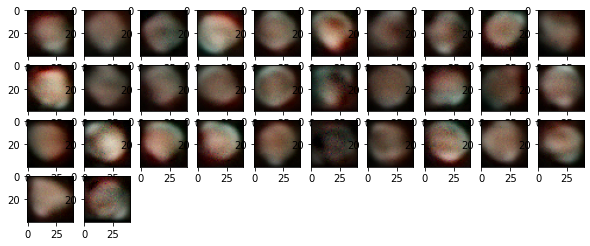

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 321


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {87.5}
Epoch 322


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {86.71875}
Epoch 323


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.890625}  Classifier F1: {89.0625}
Epoch 324


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {91.40625}
Epoch 325


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {91.40625}
Epoch 326


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {83.59375}
Epoch 327


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {84.375}
Epoch 328


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.9375}
Epoch 329


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {88.28125}
Epoch 330


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.85it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.21875}  Classifier F1: {92.96875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

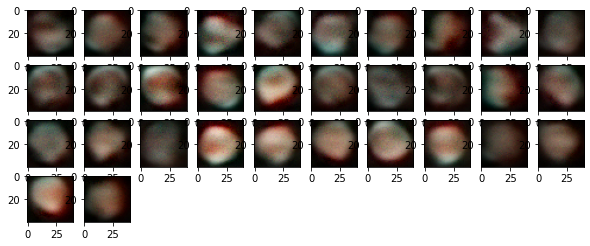

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 331


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {88.28125}
Epoch 332


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.53125}  Classifier F1: {82.03125}
Epoch 333


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.15625}
Epoch 334


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {91.40625}
Epoch 335


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {85.9375}
Epoch 336


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {83.59375}
Epoch 337


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 338


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {89.84375}
Epoch 339


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 340


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:40<00:00,  3.12it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {34.765625}  Classifier F1: {87.5}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

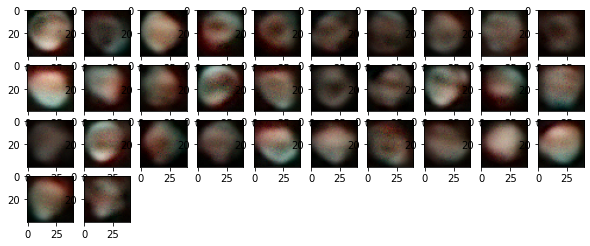

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 341


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {92.1875}
Epoch 342


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {92.1875}
Epoch 343


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 344


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {87.5}
Epoch 345


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {37.109375}  Classifier F1: {85.15625}
Epoch 346


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {92.1875}
Epoch 347


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {88.28125}
Epoch 348


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {87.5}
Epoch 349


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {89.84375}
Epoch 350


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.10it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.828125}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

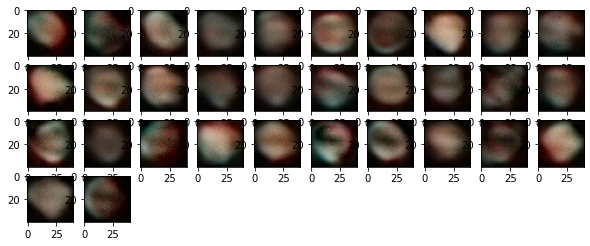

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 351


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.84375}
Epoch 352


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {89.0625}
Epoch 353


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {87.5}
Epoch 354


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.015625}  Classifier F1: {91.40625}
Epoch 355


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.96875}  Classifier F1: {89.84375}
Epoch 356


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {91.40625}
Epoch 357


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {88.28125}
Epoch 358


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {85.9375}
Epoch 359


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}
Epoch 360


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.81it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

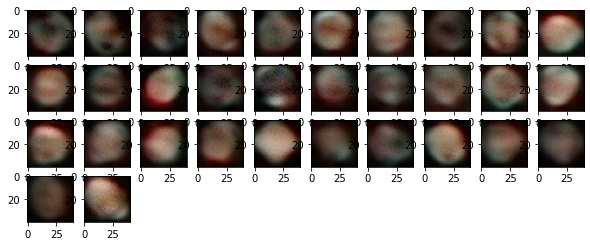

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 361


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}
Epoch 362


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {90.625}
Epoch 363


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {82.03125}
Epoch 364


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.15625}
Epoch 365


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {92.1875}
Epoch 366


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {87.5}
Epoch 367


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.796875}  Classifier F1: {85.9375}
Epoch 368


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {90.625}
Epoch 369


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {90.625}
Epoch 370


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {50.0}  Classifier F1: {92.1875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

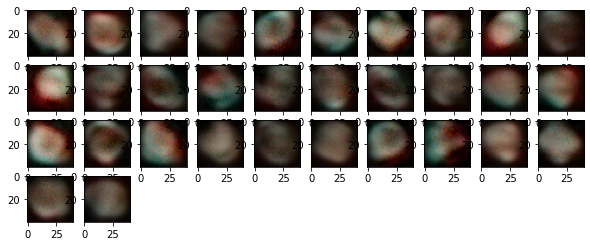

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 371


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {86.71875}
Epoch 372


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {83.59375}
Epoch 373


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {92.1875}
Epoch 374


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 375


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {88.28125}
Epoch 376


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}
Epoch 377


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {89.84375}
Epoch 378


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 379


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 380


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.77it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.4375}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

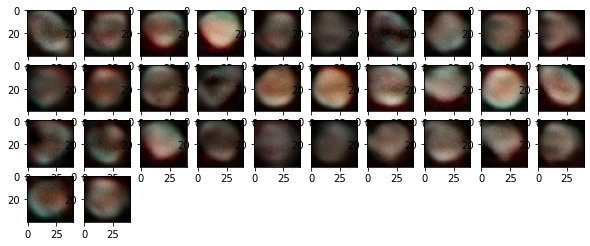

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 381


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {88.28125}
Epoch 382


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.140625}  Classifier F1: {88.28125}
Epoch 383


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {91.40625}
Epoch 384


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {92.1875}
Epoch 385


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {87.5}
Epoch 386


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.15625}
Epoch 387


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 388


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {93.75}
Epoch 389


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {89.84375}
Epoch 390


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.05it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {42.1875}  Classifier F1: {89.0625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

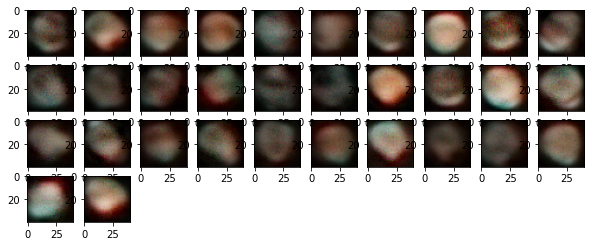

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 391


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {95.3125}
Epoch 392


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.9375}
Epoch 393


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}
Epoch 394


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {90.625}
Epoch 395


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}
Epoch 396


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.796875}  Classifier F1: {87.5}
Epoch 397


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {90.625}
Epoch 398


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.84375}
Epoch 399


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {93.75}
Epoch 400


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.83it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.21875}  Classifier F1: {87.5}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

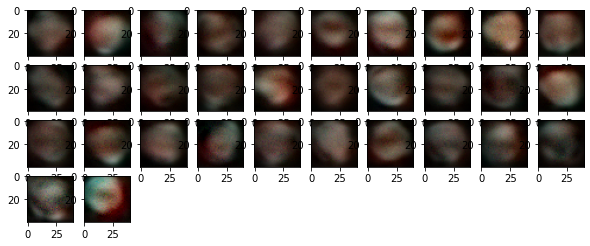

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 401


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.0625}
Epoch 402


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.3125}  Classifier F1: {85.9375}
Epoch 403


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {91.40625}
Epoch 404


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {91.40625}
Epoch 405


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 406


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {92.1875}
Epoch 407


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {91.40625}
Epoch 408


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {85.15625}
Epoch 409


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {84.375}
Epoch 410


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.05it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {85.9375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

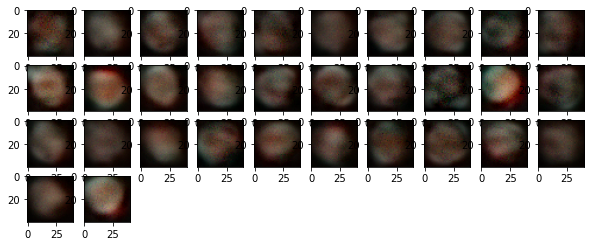

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 411


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {85.9375}
Epoch 412


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {85.9375}
Epoch 413


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {84.375}
Epoch 414


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {83.59375}
Epoch 415


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}
Epoch 416


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {92.1875}
Epoch 417


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {83.59375}
Epoch 418


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {87.5}
Epoch 419


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {84.375}
Epoch 420


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.85it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {46.484375}  Classifier F1: {90.625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

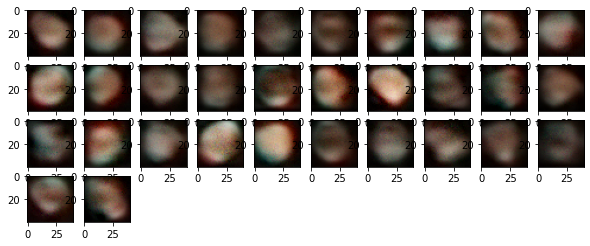

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 421


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.484375}  Classifier F1: {89.0625}
Epoch 422


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {87.5}
Epoch 423


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {42.96875}  Classifier F1: {86.71875}
Epoch 424


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 425


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {89.0625}
Epoch 426


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {87.5}
Epoch 427


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {92.96875}
Epoch 428


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {24.21875}  Classifier F1: {91.40625}
Epoch 429


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {89.0625}
Epoch 430


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {50.0}  Classifier F1: {87.5}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

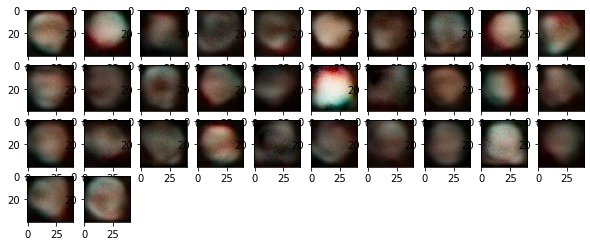

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 431


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {82.03125}
Epoch 432


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {82.03125}
Epoch 433


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {82.03125}
Epoch 434


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.84375}
Epoch 435


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.796875}  Classifier F1: {86.71875}
Epoch 436


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.0625}
Epoch 437


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {88.28125}
Epoch 438


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 439


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {93.75}
Epoch 440


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {45.703125}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

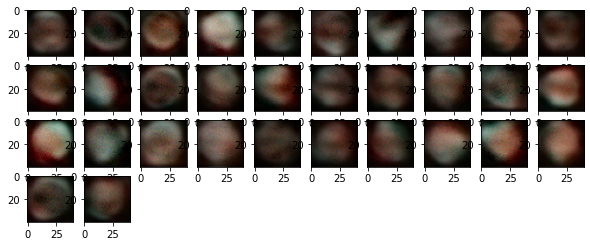

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 441


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.15625}
Epoch 442


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {89.0625}
Epoch 443


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {90.625}
Epoch 444


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {85.15625}
Epoch 445


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {82.03125}
Epoch 446


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}
Epoch 447


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {85.9375}
Epoch 448


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {92.96875}
Epoch 449


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {82.8125}
Epoch 450


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.83it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.828125}  Classifier F1: {84.375}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

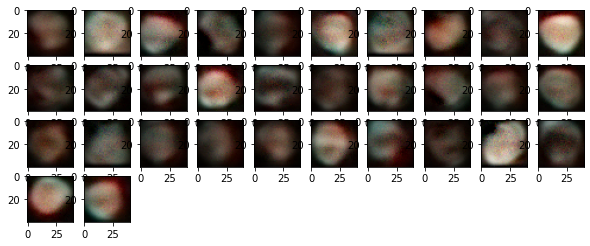

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 451


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {87.5}
Epoch 452


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {95.3125}
Epoch 453


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}
Epoch 454


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {87.5}
Epoch 455


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {89.84375}
Epoch 456


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {91.40625}
Epoch 457


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 458


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 459


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {41.40625}  Classifier F1: {89.84375}
Epoch 460


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:31<00:00,  4.04it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

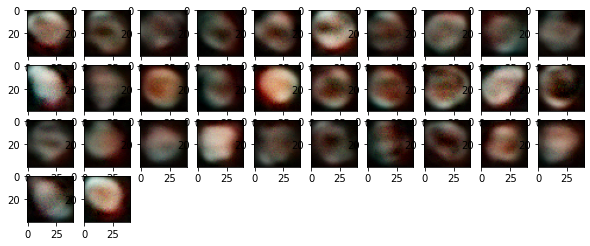

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 461


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {89.84375}
Epoch 462


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {45.703125}  Classifier F1: {91.40625}
Epoch 463


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {89.84375}
Epoch 464


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {88.28125}
Epoch 465


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.84375}
Epoch 466


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {91.40625}
Epoch 467


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {89.84375}
Epoch 468


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {92.1875}
Epoch 469


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.65625}  Classifier F1: {88.28125}
Epoch 470


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {44.921875}  Classifier F1: {86.71875}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

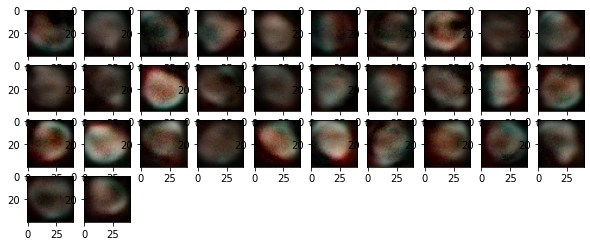

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 471


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {89.84375}
Epoch 472


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {85.15625}
Epoch 473


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}
Epoch 474


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 475


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {87.5}
Epoch 476


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {39.0625}  Classifier F1: {89.84375}
Epoch 477


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {85.15625}
Epoch 478


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.046875}  Classifier F1: {89.0625}
Epoch 479


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {47.265625}  Classifier F1: {87.5}
Epoch 480


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {49.609375}  Classifier F1: {90.625}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

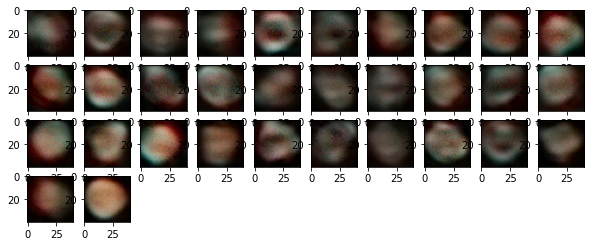

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 481


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {85.9375}
Epoch 482


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {46.875}  Classifier F1: {90.625}
Epoch 483


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {86.71875}
Epoch 484


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.828125}  Classifier F1: {83.59375}
Epoch 485


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.84375}
Epoch 486


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {86.71875}
Epoch 487


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.609375}  Classifier F1: {86.71875}
Epoch 488


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {93.75}
Epoch 489


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {48.4375}  Classifier F1: {89.84375}
Epoch 490


100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:32<00:00,  3.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 Discriminator accuracy: {45.703125}  Classifier F1: {88.28125}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

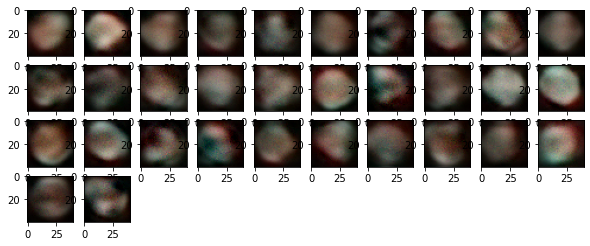

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

Epoch 491


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {44.921875}  Classifier F1: {88.28125}
Epoch 492


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {49.21875}  Classifier F1: {90.625}
Epoch 493


  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 Discriminator accuracy: {50.0}  Classifier F1: {89.0625}
Epoch 494


 66%|█████████████████████████████████████████████████████▏                           | 84/128 [00:22<00:09,  4.54it/s]

In [ ]:
from tqdm import tqdm

import matplotlib.pyplot as plt

def plot_generated_images(epoch, generator):
    
    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
    generated_images = generator.predict(noise)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        plt.imshow(image.reshape((img_rows, img_cols, channels)))
            
    plt.show()
    
def training(epochs=1, batch_size=128):
    
    #Loading the data
    batch_count = x_train.shape[0] / batch_size
    
    # Creating GAN
    generator= create_generator()
    generator.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])
    discriminator= create_discriminator()
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    classifier = create_classifier()
    classifier.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=[get_f1])
    
    gan = create_gan(discriminator, generator, classifier)
    gan.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])
   
    discriminator.trainable=False
    
    
    for e in range(1, 20 ):
        print("Epoch %d" %e)
        for _ in tqdm(range(batch_size)):
        
            image_batch = x_train[np.random.randint(low=0,high=x_train.shape[0],size=batch_size)]
            noise = np.random.normal(0,1, [batch_size, 100])
        
            generator.train_on_batch( noise , image_batch) 
        
        if e == 1 or e % 2 == 0:
           
                plot_generated_images(e, generator)
        
    
    for e in range(1,epochs+1 ):
        print("Epoch %d" %e)
        for _ in tqdm(range(batch_size)):
        #generate  random noise as an input  to  initialize the  generator
            noise= np.random.normal(0,1, [batch_size, 100])
            
            # Generate fake MNIST images from noised input
            generated_images = generator.predict(noise)
            
            # Get a random set of  real images
            image_batch = x_train[np.random.randint(low=0,high=x_train.shape[0],size=batch_size)]
            
            #Construct different batches of  real and fake data 
            X= np.concatenate([image_batch, generated_images])
            
            # Labels for generated and real data
            y_dis=np.zeros(2*batch_size)
            y_dis[:batch_size]= 0.9 
            
            #Pre train discriminator on  fake and real data  before starting the gan. 
            discriminator.trainable=True
            discriminator_metric = discriminator_metric = discriminator.train_on_batch(X, y_dis) 
            
            #Tricking the noised input of the Generator as real data
            noise= np.random.normal(0,1, [batch_size, 100])
            y_gen = np.ones(batch_size)
            
            # During the training of gan, 
            # the weights of discriminator should be fixed. 
            #We can enforce that by setting the trainable flag
            discriminator.trainable=False
            
            ################################
            
            noise2 = np.random.normal(0,1, [32, 100])
            
            # Get a random set of  real images
            inv_batch = x_train[np.random.randint(low=0,high=x_train.shape[0],size=32)]
            
            # Get a random set of  real images
            noninv_batch = x_train_noninv[np.random.randint(low=0,high=x_train_noninv.shape[0],size=64)]
            
            gen_images = generator.predict(noise2)
            
            X_img= np.concatenate([ gen_images , inv_batch , noninv_batch ])
            
            y_truth = get_label(16,48,64)
            
            classifier_metric = classifier.train_on_batch( X_img, y_truth)
            
            #training  the GAN by alternating the training of the Discriminator 
            #and training the chained GAN model with Discriminator’s weights freezed.
            generator_metric = gan.train_on_batch(noise, y_gen)
        
        print(" Discriminator accuracy:", {100*discriminator_metric[1]}," Classifier F1:", {100*classifier_metric[1]})    
        
        if e == 1 or e % 10 == 0:
           
            plot_generated_images(e, generator)
        
    return generator, classifier
    
gt, model = training(600,128)

In [98]:
pred = model.predict(X_test)
p = np.round(pred)
f1 = get_f1(Y_test, p)
f1

y_p = []
for i in range(len(p)):
    if ( p[i][0] == 0 ):
        y_p.append(1)
    else :
        y_p.append(0)
y_p = np.array(y_p)
y_t = []
for i in range(len(Y_test)):
    if ( Y_test[i][0] == 0 ):
        y_t.append(1)
    else :
        y_t.append(0)
y_t = np.array(y_t)

from sklearn.metrics import confusion_matrix
a=(confusion_matrix(y_t, y_p , labels=[0,1]))
a

array([[ 1110, 15634],
       [ 2849,   603]], dtype=int64)

In [15]:
gt.save('D:/data/g40long.h5')

In [ ]:
#model.save('C:/Users/chsha/Downloads/eBay_ML_Challenge_Dataset_2021/eBay_ML_Challenge_Dataset_2021/base_clf1_model.h5')

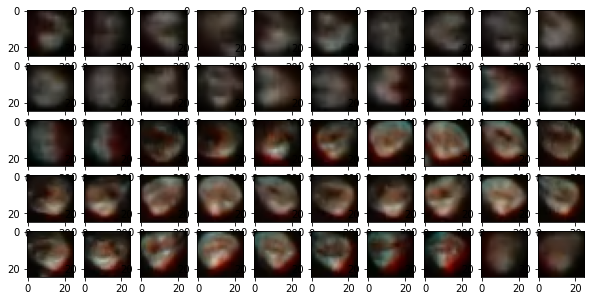

In [65]:
plt.figure(figsize=(10, 10))
for i in range(0,50):
        plt.subplot(10, 10, i+1)
        plt.imshow(x_train[i].reshape((img_rows, img_cols, channels)))
            
plt.show()

In [10]:
g = keras.models.load_model('D:/data/gmodel.h5')

In [16]:
noise = np.random.normal(0, 1, size=(60000, 100))
generated_images = gt.predict(noise)
#plt.figure(figsize=(10, 10))
    
#for i, image in enumerate(generated_images):
   # plt.subplot(10, 10, i+1)
   # plt.imshow(image.reshape((40, 40, 3)))
            
#plt.show()

In [99]:
np.shape(generated_images)

(50000, 1875)

In [17]:
generated_images = generated_images.astype('float32') / 255.
generated_images = np.reshape(generated_images, (len(generated_images),40,40,3))

In [26]:
data = []
label = []
for i in tr1[:(int) (tran_index_inv)]:
    for j in glob(i+'/*'):
        data.append(j)
        label.append(1)

ydata = []
        
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (40, 40))
    c = np.array(b)
    ydata.append(c.reshape(40*40*3))
    
        
xdata = np.array(ydata)
x_train = xdata
x_train = x_train.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train),40*40*3))

for i in tr2[:(int)(tran_index_noninv)]:
    for j in glob(i+'/*'):
        data.append(j)
        label.append(0)

imgdata=[]
for i in range(len(data)):
    a = cv2.imread(data[i])
    b = cv2.resize(a,dsize = (40, 40))
    c = np.array(b)
    imgdata.append(c.reshape(40,40,3))
    

In [109]:
np.shape(imgdata)

(92537, 25, 25, 3)

In [19]:
for i in range(0,len(generated_images)):
    imgdata.append(generated_images[i].reshape(40,40,3))
    label.append(1)

In [27]:
from tensorflow.keras.utils import to_categorical
idata = np.array(imgdata)
X_train = idata
X_train = X_train.astype('float32') / 255.
X_train = np.reshape(X_train, (len(X_train),40,40,3))
# One hot vector representation of labels
Y_train = to_categorical(label)

In [28]:
from sklearn.utils import shuffle
X_train,Y_train = shuffle(X_train,Y_train)

In [29]:
np.shape(X_train)

(92537, 40, 40, 3)

In [32]:

model = models.Sequential()
model.add(layers.Dense(512, input_shape=(40* 40* 3,)))
model.add(layers.Dense(256, activation="relu"))
model.add(layers.Dense(32, activation="relu"))
model.add(layers.Dense(2, activation="softmax"))
#model.summary()

In [33]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=[get_f1])

model.fit(X_train, Y_train, epochs=10, batch_size=32, validation_split = .3, verbose = 1)

Epoch 1/10
2025/2025 [==============================] - 34s 16ms/step - loss: 0.2473 - get_f1: 0.8975 - val_loss: 0.1404 - val_get_f1: 0.9417
Epoch 2/10
2025/2025 [==============================] - 34s 17ms/step - loss: 0.1999 - get_f1: 0.9185 - val_loss: 0.1094 - val_get_f1: 0.9569
Epoch 3/10
2025/2025 [==============================] - 36s 18ms/step - loss: 0.1884 - get_f1: 0.9239 - val_loss: 0.0933 - val_get_f1: 0.9651
Epoch 4/10
2025/2025 [==============================] - 36s 18ms/step - loss: 0.1793 - get_f1: 0.9274 - val_loss: 0.1429 - val_get_f1: 0.9437
Epoch 5/10
2025/2025 [==============================] - 33s 16ms/step - loss: 0.1742 - get_f1: 0.9306 - val_loss: 0.1010 - val_get_f1: 0.9650
Epoch 6/10
2025/2025 [==============================] - 34s 17ms/step - loss: 0.1709 - get_f1: 0.9311 - val_loss: 0.1480 - val_get_f1: 0.9397
Epoch 7/10
2025/2025 [==============================] - 37s 18ms/step - loss: 0.1662 - get_f1: 0.9330 - val_loss: 0.2366 - val_get_f1: 0.9123
Epoch 

In [34]:
pred = model.predict(X_test)
p = np.round(pred)
f1 = get_f1(Y_test, p)
f1

y_p = []
for i in range(len(p)):
    if ( p[i][0] == 0 ):
        y_p.append(1)
    else :
        y_p.append(0)
y_p = np.array(y_p)
y_t = []
for i in range(len(Y_test)):
    if ( Y_test[i][0] == 0 ):
        y_t.append(1)
    else :
        y_t.append(0)
y_t = np.array(y_t)

from sklearn.metrics import confusion_matrix
a=(confusion_matrix(y_t, y_p , labels=[0,1]))
a

array([[15873,   871],
       [  475,  2977]], dtype=int64)